# Online news popularity EDA

Farin Khan 
SAP Id: 60009210140

In [1]:
#importing basic necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#creating a pandas dataframe for the dataset
df=pd.read_csv("OnlineNewsPopularity.csv")
df.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [3]:
#checking the general info about the dataset to get a view about the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   url                             39644 non-null  object 
 1   timedelta                       39644 non-null  float64
 2   n_tokens_title                  39644 non-null  float64
 3   n_tokens_content                39644 non-null  float64
 4   n_unique_tokens                 39644 non-null  float64
 5   n_non_stop_words                39644 non-null  float64
 6   n_non_stop_unique_tokens        39644 non-null  float64
 7   num_hrefs                       39644 non-null  float64
 8   num_self_hrefs                  39644 non-null  float64
 9   num_imgs                        39644 non-null  float64
 10  num_videos                      39644 non-null  float64
 11  average_token_length            39644 non-null  float64
 12  num_keywords                    

In [4]:
#checking for missing values
df.isnull().sum().sum()

0

In [5]:
#checking for missing rows
df.duplicated().sum()

0

In [6]:
#checking if there are repeated url which would mean there is inconsistent data
df.url.nunique()

39644

There is no missing values, duplicate values or inconsistent values in the data.

In [7]:
#removing the space in the name of the column to avoid inconvenience
df.columns=df.columns.str.replace(" ","")
#dropping the url column as it is unique for each data point and does not add any value to the model
df.drop(['url'],axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 60 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   timedelta                      39644 non-null  float64
 1   n_tokens_title                 39644 non-null  float64
 2   n_tokens_content               39644 non-null  float64
 3   n_unique_tokens                39644 non-null  float64
 4   n_non_stop_words               39644 non-null  float64
 5   n_non_stop_unique_tokens       39644 non-null  float64
 6   num_hrefs                      39644 non-null  float64
 7   num_self_hrefs                 39644 non-null  float64
 8   num_imgs                       39644 non-null  float64
 9   num_videos                     39644 non-null  float64
 10  average_token_length           39644 non-null  float64
 11  num_keywords                   39644 non-null  float64
 12  data_channel_is_lifestyle      39644 non-null 

<AxesSubplot:>

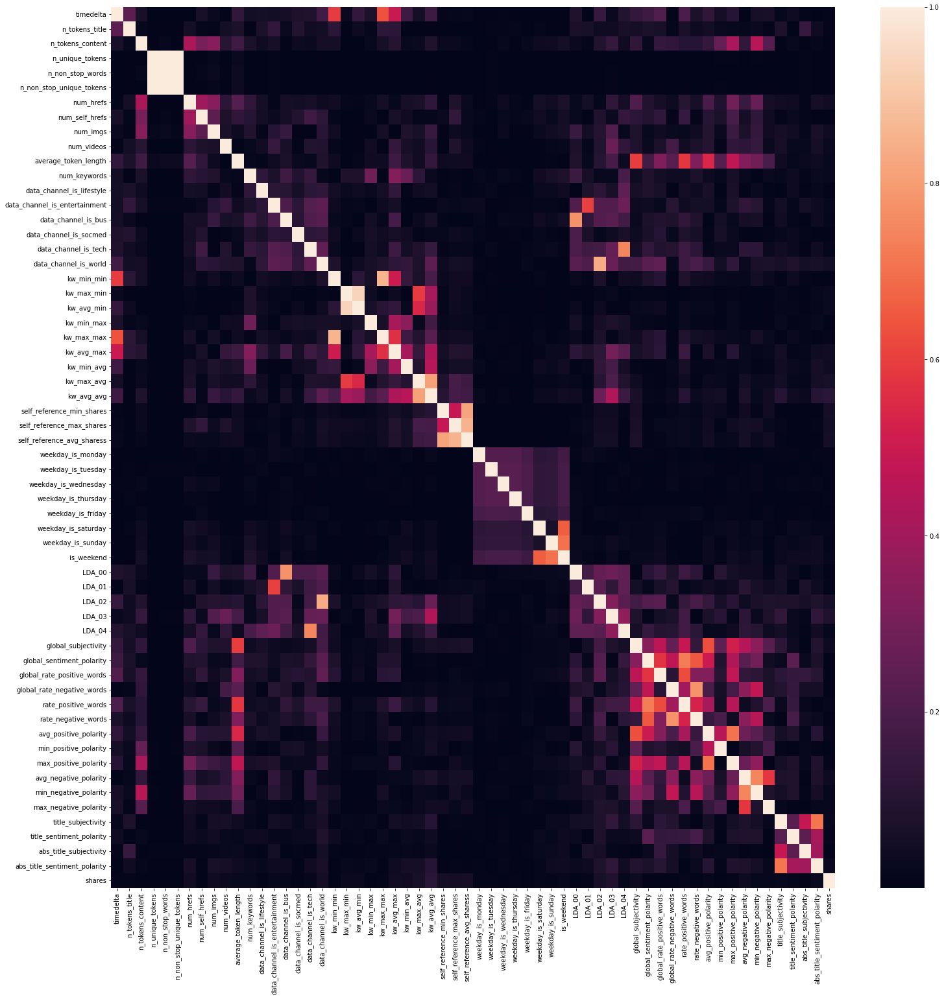

In [8]:
#checking for correlated columns
corr_data=df.corr().abs()
plt.figure(figsize=(25,25))
sns.heatmap(corr_data)

In [9]:
#removing highly correlated data (correlation > 0.9)

#select upper triangle of correlation matrix
upper = corr_data.where(np.triu(np.ones(corr_data.shape), k=1).astype(bool))

#find features with correlation > 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

#drop features 
df1=df.drop(to_drop, axis=1)
df1.shape

(39644, 57)

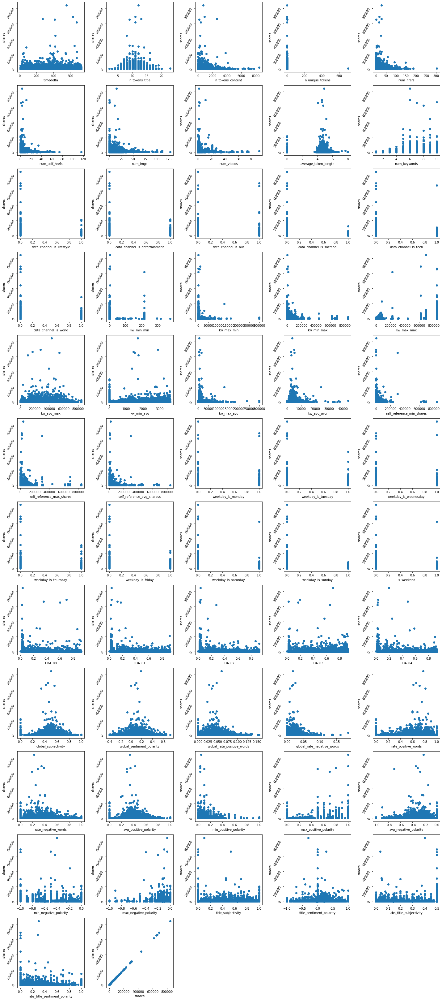

In [10]:
#checking if linear regression can be applied on the data
#visualising all the variables with the target variable
plt.figure(figsize=(20,45))
for i,feature in enumerate(df1.columns):
    plt.subplot(12,5,i+1)
    plt.scatter(df1[feature],df1['shares'])
    plt.yticks(rotation=60)
    plt.xlabel(feature)
    plt.ylabel('shares')
plt.tight_layout()

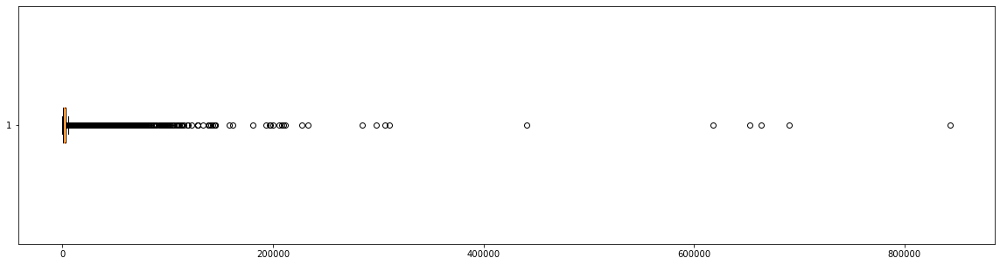

In [11]:
#the visualisation above shows that linear regression will not work in this data
#also we spot a lot of outliers in the plot
#plotting the boxplot for the target variable
plt.figure(figsize=(20,5))
B=plt.boxplot(df1['shares'], vert=False)

In [12]:
'''in this case the outliers are novelty as there could have been articles that had exceptionally 
high popularity hence we cannot remove them.'''
'''hence we will convert this problem into classification problem with the outliers as a separate 
novel class.'''

'hence we will convert this problem into classification problem with the outliers as a separate \nnovel class.'

In [13]:
B

{'whiskers': [<matplotlib.lines.Line2D at 0x169c9eaef10>,
 'caps': [<matplotlib.lines.Line2D at 0x169c9ebd5b0>,
 'boxes': [<matplotlib.lines.Line2D at 0x169c9eaeac0>],
 'medians': [<matplotlib.lines.Line2D at 0x169c9ebdcd0>],
 'fliers': [<matplotlib.lines.Line2D at 0x169c9ec60a0>],
 'means': []}

In [14]:
[item.get_xdata()[1] for item in B['whiskers']]

[1.0, 5500.0]

In [15]:
#Creating classes
share_label = list()
for share in df1['shares']:
    if share <= 1100:
        share_label.append(5) #Very Poor(1st 20%)
    elif share > 1100 and share <= 2200:
        share_label.append(4) #Poor(next 20%)
    elif share > 2200 and share <= 3300:
        share_label.append(3) #Average(next 20%)
    elif share > 3300 and share <= 4400:
        share_label.append(2) #Good(next 20%)
    elif share > 4400 and share <= 5500:
        share_label.append(1) #Very Good(next 20%)
    else:
        share_label.append(0) #Exceptional

# Update this class label into the dataframe
df1 = pd.concat([df1, pd.DataFrame(share_label, columns=['popularity'])], axis=1)
#df.drop(['shares'],axis=1,inplace=True) # dropping the shares column to avoid redundancy
df1.head()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,...,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,popularity
0,731.0,12.0,219.0,0.663594,4.0,2.0,1.0,0.0,4.680365,5.0,...,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593,5
1,731.0,9.0,255.0,0.604743,3.0,1.0,1.0,0.0,4.913725,4.0,...,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711,5
2,731.0,9.0,211.0,0.575130,3.0,1.0,1.0,0.0,4.393365,6.0,...,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500,4
3,731.0,9.0,531.0,0.503788,9.0,0.0,1.0,0.0,4.404896,7.0,...,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200,4
4,731.0,13.0,1072.0,0.415646,19.0,19.0,20.0,0.0,4.682836,7.0,...,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505,5


<AxesSubplot:xlabel='popularity', ylabel='count'>

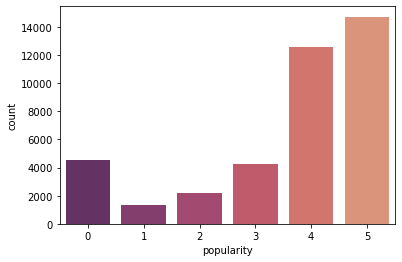

In [16]:
#visualising the target class 
sns.countplot(x ='popularity', data = df1, palette='flare_r')

There is a lot of imbalance in the target class labels. 

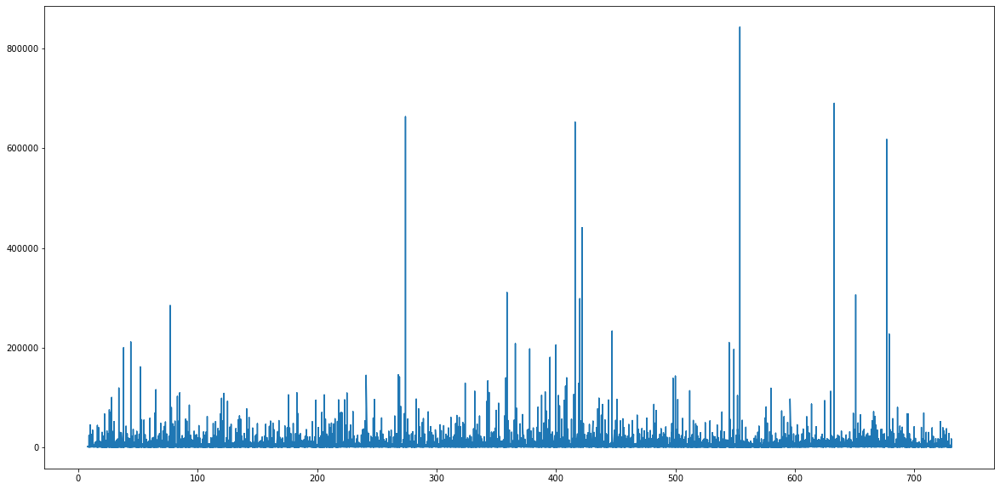

In [17]:
#checking if time has any influence on the popularity of the news
plt.figure(figsize=(20,10))
plt.plot(df1['timedelta'], list(map(lambda x:np.mean(x),df1['shares'])))

In [18]:
acquisition_date = pd.to_datetime('2015-01-08')

# subtract the timedelta from the acquisition date to get the publication date
df1['publication_date'] = acquisition_date - df1['timedelta'].map(lambda x:pd.Timedelta(days=int(x)))

# extract the year, month, and day from the publication date
df1['year'] = df1['publication_date'].dt.year
df1['month'] = df1['publication_date'].dt.month
df1['day'] = df1['publication_date'].dt.day

# print the resulting dataframe
df1.head()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,...,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,popularity,publication_date,year,month,day
0,731.0,12.0,219.0,0.663594,4.0,2.0,1.0,0.0,4.680365,5.0,...,0.500000,-0.187500,0.000000,0.187500,593,5,2013-01-07,2013,1,7
1,731.0,9.0,255.0,0.604743,3.0,1.0,1.0,0.0,4.913725,4.0,...,0.000000,0.000000,0.500000,0.000000,711,5,2013-01-07,2013,1,7
2,731.0,9.0,211.0,0.575130,3.0,1.0,1.0,0.0,4.393365,6.0,...,0.000000,0.000000,0.500000,0.000000,1500,4,2013-01-07,2013,1,7
3,731.0,9.0,531.0,0.503788,9.0,0.0,1.0,0.0,4.404896,7.0,...,0.000000,0.000000,0.500000,0.000000,1200,4,2013-01-07,2013,1,7
4,731.0,13.0,1072.0,0.415646,19.0,19.0,20.0,0.0,4.682836,7.0,...,0.454545,0.136364,0.045455,0.136364,505,5,2013-01-07,2013,1,7


In [19]:
!pip install plotly-calplot

In [20]:
#visualising if there are any patterns in the outlier shares
from plotly_calplot import calplot

fig = calplot(df1, x="publication_date", y="popularity")
fig.show()

In [21]:
#the white areas in the above plot are the anomlies. We don't see any particular trend about them.

#we avoid dropping instances with outliers as they may be novelties in data in the present context.

#dropping variables, share, publication_date as they add redundancy.
df1.drop(['shares','publication_date'],axis=1,inplace=True)
df1.describe()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,...,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,popularity,year,month,day
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,...,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,354.530471,10.398749,546.514731,0.548216,10.883690,3.293638,4.544143,1.249874,4.548239,7.223767,...,-0.521944,-0.107500,0.282353,0.071425,0.341843,0.156064,3.594617,2013.540990,6.624281,15.739809
std,214.163767,2.114037,471.107508,3.520708,11.332017,3.855141,8.309434,4.107855,0.844406,1.909130,...,0.290290,0.095373,0.324247,0.265450,0.188791,0.226294,1.634116,0.498323,3.398314,8.662922
min,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,2013.000000,1.000000,1.000000
25%,164.000000,9.000000,246.000000,0.470870,4.000000,1.000000,1.000000,0.000000,4.478404,6.000000,...,-0.700000,-0.125000,0.000000,0.000000,0.166667,0.000000,3.000000,2013.000000,4.000000,8.000000
50%,339.000000,10.000000,409.000000,0.539226,8.000000,3.000000,1.000000,0.000000,4.664082,7.000000,...,-0.500000,-0.100000,0.150000,0.000000,0.500000,0.000000,4.000000,2014.000000,7.000000,16.000000
75%,542.000000,12.000000,716.000000,0.608696,14.000000,4.000000,4.000000,1.000000,4.854839,9.000000,...,-0.300000,-0.050000,0.500000,0.150000,0.500000,0.250000,5.000000,2014.000000,10.000000,23.000000
max,731.000000,23.000000,8474.000000,701.000000,304.000000,116.000000,128.000000,91.000000,8.041534,10.000000,...,0.000000,0.000000,1.000000,1.000000,0.500000,1.000000,5.000000,2014.000000,12.000000,31.000000


In [22]:
# n_tokens_content represents Number of words in the content
# However its minimum value to be 0. Means that there are articles that do not have any content.
# This could have been due to unknown data being filled with 0 
#checking the situation
df1['n_tokens_content'].value_counts()

0.0       1181
286.0      101
225.0       86
335.0       86
279.0       85
          ... 
2611.0       1
2309.0       1
3320.0       1
1664.0       1
2509.0       1
Name: n_tokens_content, Length: 2406, dtype: int64

In [23]:
#since there are a lot of articles with 0 value for word count we will fill the cells with median
df1['n_tokens_content'].replace(0, np.median(df1['n_tokens_content']), inplace=True)
df1[df1['n_tokens_content'] == 0]

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,...,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,popularity,year,month,day


<BarContainer object of 6 artists>

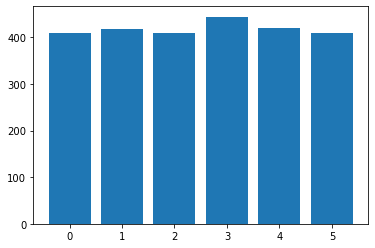

In [24]:
# Average number of words for articles across levels of popularity

plt.bar([0,1,2,3,4,5],df1.groupby('popularity')['n_tokens_content'].median())

In [25]:
Wday = df.columns.values[30:37]
Wday

array(['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday',
       'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday',
       'weekday_is_sunday'], dtype=object)

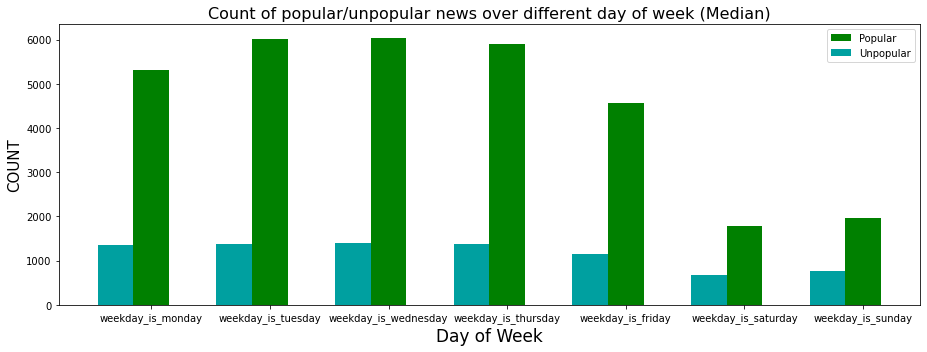

In [26]:
Unpop=df1[df1['popularity']<3]
Pop=df1[df1['popularity']>=3]
Unpop_day = Unpop[Wday].sum().values
Pop_day = Pop[Wday].sum().values

fig = plt.figure(figsize = (13,5))
plt.title("Count of popular/unpopular news over different day of week (Median)", fontsize = 16)

plt.bar(np.arange(len(Wday)),Pop_day,width=0.3,align='center',color='g',label='Popular')
plt.bar(np.arange(len(Wday))-0.3,Unpop_day,width=0.3,align='center',color='#00A0A0',label='Unpopular')

plt.xticks(np.arange(len(Wday)),Wday)
plt.ylabel('COUNT',fontsize=15)
plt.xlabel('Day of Week',fontsize=17)

plt.legend(loc = 'upper right')
plt.tight_layout()
plt.show()

News posted on weekends hav lesser popularity as compared to ones posted on other weekdays.

In [27]:
Dc=df.columns[12:18]
Dc

Index(['data_channel_is_lifestyle', 'data_channel_is_entertainment',
       'data_channel_is_bus', 'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world'],
      dtype='object')

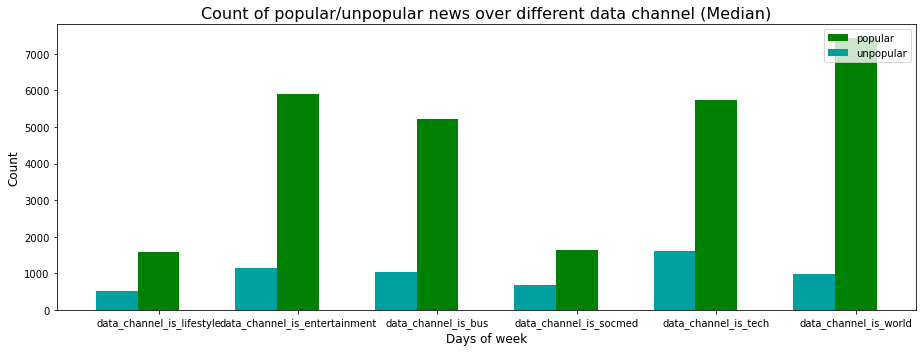

In [28]:
Unpop=df1[df1['popularity']<3]
Pop=df1[df1['popularity']>=3]
Unpop_day = Unpop[Dc].sum().values
Pop_day = Pop[Dc].sum().values
fig = plt.figure(figsize = (13,5))
plt.title("Count of popular/unpopular news over different data channel (Median)", fontsize = 16)
plt.bar(np.arange(len(Dc)), Pop_day, width = 0.3, align="center", color = 'g', \
          label = "popular")
plt.bar(np.arange(len(Dc)) - 0.3, Unpop_day, width = 0.3, align = "center", color = '#00A0A0', \
          label = "unpopular")
plt.xticks(np.arange(len(Dc)), Dc)
plt.ylabel("Count", fontsize = 12)
plt.xlabel("Days of week", fontsize = 12)
    
plt.legend(loc = 'upper right')
plt.tight_layout()
plt.show()

World news is the most popular followed by entertainment industry news.

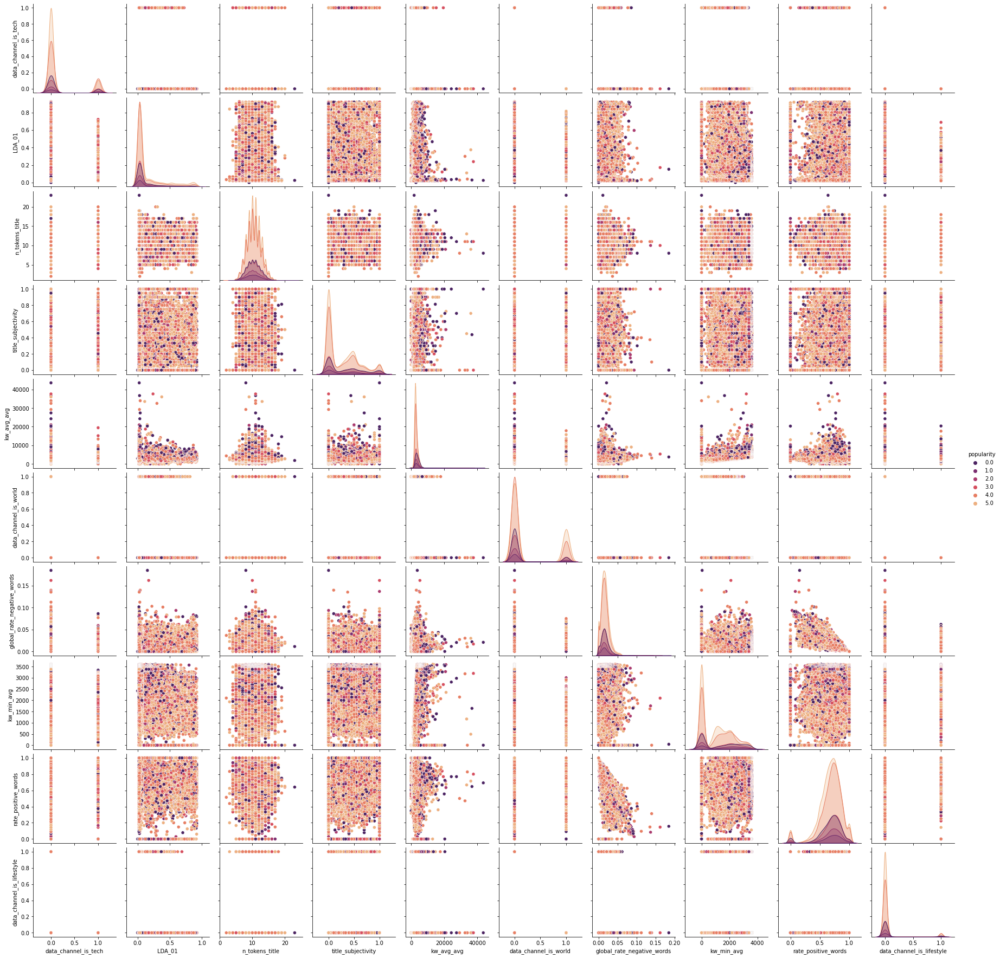

In [39]:
#visualising to see what models might be suitable for the data
df_sample = df1['popularity'].to_frame().join(df1.sample(10 , axis=1)).T.drop_duplicates().T
sns.pairplot(df_sample,hue='popularity',palette='flare_r')

Looking at the pairplots, we cannot use logistic regression to solve the problem as data is not linearly separable. We can use decision tree and various ensemble models for non linear classification.

Using kfold cross valiadation as a means of performance evaluation as we are dealing with a complex dataset and we need to make sure the model is generalised.

In [30]:
X=df1.drop(['popularity'],axis=1).copy()
y=df1['popularity'].copy()

In [40]:
#Training the model on Decision tree classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold,cross_val_score

kf = KFold(n_splits=10,random_state=None)
clf = DecisionTreeClassifier(random_state=0)

result = cross_val_score(clf, X, y, cv = kf)
 
print("Avg accuracy: ",result.mean())

Avg accuracy:  0.30963149429353465


In [41]:
#As the accuracy is low of decision tree classifier is much low and the dataset is quite complex, 
#implementing an ensemble model - random forest would be a good idea.
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier()

result = cross_val_score(rf_clf, X, y, cv = kf)
 
print("Avg accuracy: ",result.mean())

Avg accuracy:  0.43557770883729097


In [32]:
pip install xgboost

  Using cached xgboost-1.7.5-py3-none-win_amd64.whl (70.9 MB)
Note: you may need to restart the kernel to use updated packages.


In [33]:
#As xg boost is a very good at handling large dataset.
import xgboost as xgb
xgb_model = xgb.XGBClassifier(objective="multi:softprob", random_state=None)

result = cross_val_score(xgb_model, X, y, cv = kf)
 
print("Avg accuracy: ",result.mean())

Avg accuracy:  0.4353510790048647


In [34]:
#As SVM is a very robust model and can handle outliers and other shortcomings in data.
#Using kernel as data is not linearly separable
from sklearn.svm import SVC
rbf_svc = SVC(kernel='rbf')
result = cross_val_score(rbf_svc, X, y, cv = kf)
 
print("Avg accuracy: ",result.mean())

Avg accuracy:  0.3673702986398393


In [38]:
poly_svc = SVC(kernel='poly')
result = cross_val_score(poly_svc, X, y, cv = kf)
 
print("Avg accuracy: ",result.mean())

Avg accuracy:  0.37430597954096323


Performing parameter tuning on random forest as it took lesser time to train as compared to xgboost(which will make the grid search process faster) and has the best accuracy among all other models. 

In [42]:
#Using grid search cv to find the best parameters for the model
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=kf, scoring='accuracy', n_jobs=-1)
grid_search.fit(X, y)

print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

Best Parameters: {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 200}
Best Score: 0.4432205231700691
